In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LinearRegression,Lasso,LassoCV,Ridge,RidgeCV,ElasticNet,ElasticNetCV
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from pandas_profiling import profile_report
from sklearn import metrics
%matplotlib inline

In [2]:
from sklearn.datasets import load_boston

In [3]:
house = load_boston()

In [4]:
print(house.filename)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\datasets\data\boston_house_prices.csv


In [5]:
data = pd.DataFrame(house.data,columns=house.feature_names)

In [6]:
data.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33


In [7]:
data['PRICE'] = house.target
data.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    float64
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  PRICE    506 non-null    float64
dtypes: float64(14)
memory usage: 55.5 KB


In [9]:
data.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
data.corr()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
CRIM,1.000000,-0.200469,0.406583,-0.055892,0.420972,-0.219247,0.352734,-0.379670,0.625505,0.582764,0.289946,-0.385064,0.455621,-0.388305
ZN,-0.200469,1.000000,-0.533828,-0.042697,-0.516604,0.311991,-0.569537,0.664408,-0.311948,-0.314563,-0.391679,0.175520,-0.412995,0.360445
INDUS,0.406583,-0.533828,1.000000,0.062938,0.763651,-0.391676,0.644779,-0.708027,0.595129,0.720760,0.383248,-0.356977,0.603800,-0.483725
CHAS,-0.055892,-0.042697,0.062938,1.000000,0.091203,0.091251,0.086518,-0.099176,-0.007368,-0.035587,-0.121515,0.048788,-0.053929,0.175260
NOX,0.420972,-0.516604,0.763651,0.091203,1.000000,-0.302188,0.731470,-0.769230,0.611441,0.668023,0.188933,-0.380051,0.590879,-0.427321
RM,-0.219247,0.311991,-0.391676,0.091251,-0.302188,1.000000,-0.240265,0.205246,-0.209847,-0.292048,-0.355501,0.128069,-0.613808,0.695360
AGE,0.352734,-0.569537,0.644779,0.086518,0.731470,-0.240265,1.000000,-0.747881,0.456022,0.506456,0.261515,-0.273534,0.602339,-0.376955
DIS,-0.379670,0.664408,-0.708027,-0.099176,-0.769230,0.205246,-0.747881,1.000000,-0.494588,-0.534432,-0.232471,0.291512,-0.496996,0.249929
RAD,0.625505,-0.311948,0.595129,-0.007368,0.611441,-0.209847,0.456022,-0.494588,1.000000,0.910228,0.464741,-0.444413,0.488676,-0.381626
TAX,0.582764,-0.314563,0.720760,-0.035587,0.668023,-0.292048,0.506456,-0.534432,0.910228,1.000000,0.460853,-0.441808,0.543993,-0.468536


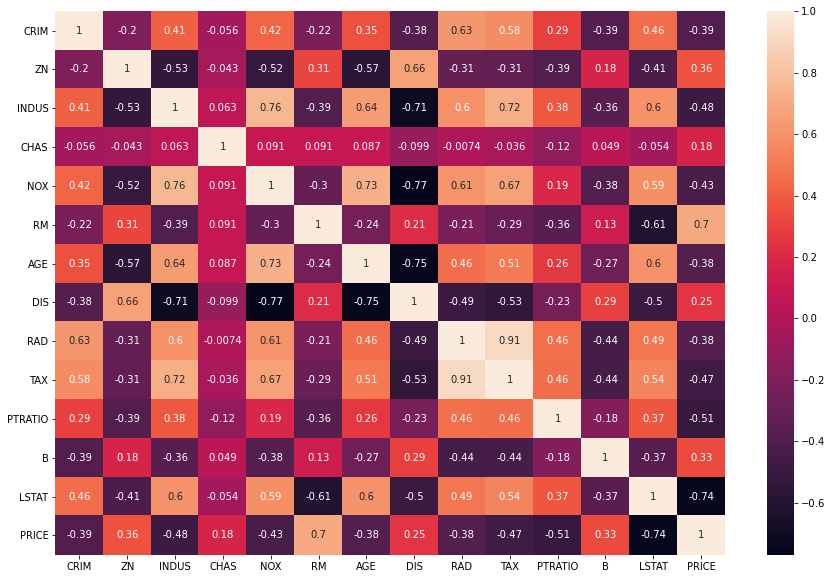

In [11]:
corr=data.corr()
plt.subplots(figsize=(15,10))
sns.heatmap(corr,annot= True)
plt.show()

### Step 1. Build a Linear Regression Model and Evaluate. (With Outliers and include all the featuers)

In [12]:
X = data.drop(['PRICE'],axis=1)
y = data['PRICE']

In [13]:
scaler= StandardScaler()

In [14]:
arr = scaler.fit_transform(X)         #Scaling independent/feature values

In [15]:
arr

array([[-0.41978194,  0.28482986, -1.2879095 , ..., -1.45900038,
         0.44105193, -1.0755623 ],
       [-0.41733926, -0.48772236, -0.59338101, ..., -0.30309415,
         0.44105193, -0.49243937],
       [-0.41734159, -0.48772236, -0.59338101, ..., -0.30309415,
         0.39642699, -1.2087274 ],
       ...,
       [-0.41344658, -0.48772236,  0.11573841, ...,  1.17646583,
         0.44105193, -0.98304761],
       [-0.40776407, -0.48772236,  0.11573841, ...,  1.17646583,
         0.4032249 , -0.86530163],
       [-0.41500016, -0.48772236,  0.11573841, ...,  1.17646583,
         0.44105193, -0.66905833]])

In [16]:
data1 = pd.DataFrame(arr)

In [17]:
data1

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-0.419782,0.284830,-1.287909,-0.272599,-0.144217,0.413672,-0.120013,0.140214,-0.982843,-0.666608,-1.459000,0.441052,-1.075562
1,-0.417339,-0.487722,-0.593381,-0.272599,-0.740262,0.194274,0.367166,0.557160,-0.867883,-0.987329,-0.303094,0.441052,-0.492439
2,-0.417342,-0.487722,-0.593381,-0.272599,-0.740262,1.282714,-0.265812,0.557160,-0.867883,-0.987329,-0.303094,0.396427,-1.208727
3,-0.416750,-0.487722,-1.306878,-0.272599,-0.835284,1.016303,-0.809889,1.077737,-0.752922,-1.106115,0.113032,0.416163,-1.361517
4,-0.412482,-0.487722,-1.306878,-0.272599,-0.835284,1.228577,-0.511180,1.077737,-0.752922,-1.106115,0.113032,0.441052,-1.026501
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,-0.413229,-0.487722,0.115738,-0.272599,0.158124,0.439316,0.018673,-0.625796,-0.982843,-0.803212,1.176466,0.387217,-0.418147
502,-0.415249,-0.487722,0.115738,-0.272599,0.158124,-0.234548,0.288933,-0.716639,-0.982843,-0.803212,1.176466,0.441052,-0.500850
503,-0.413447,-0.487722,0.115738,-0.272599,0.158124,0.984960,0.797449,-0.773684,-0.982843,-0.803212,1.176466,0.441052,-0.983048
504,-0.407764,-0.487722,0.115738,-0.272599,0.158124,0.725672,0.736996,-0.668437,-0.982843,-0.803212,1.176466,0.403225,-0.865302


## Checking multi- collinearity

In [18]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [19]:
vif_df = pd.DataFrame()

In [20]:
vif_df['vif']=[variance_inflation_factor(arr,i) for i in range (arr.shape[1])]
vif_df['features'] = X.columns


In [21]:
vif_df

,vif,features
0,1.792192,CRIM
1,2.298758,ZN
2,3.991596,INDUS
3,1.073995,CHAS
4,4.393720,NOX
5,1.933744,RM
6,3.100826,AGE
7,3.955945,DIS
8,7.484496,RAD
9,9.008554,TAX


In [22]:
X_train,X_test,y_train,y_test = train_test_split(arr,y,test_size=0.25,random_state=50)

In [23]:
LR =LinearRegression()

In [24]:
LR.fit(X_train,y_train)   #training 75% of dataset

LinearRegression()

# Score 1 (With Outliers and include all the featuers)

In [25]:
LR.score(X_train,y_train)

0.7462057732133862

In [26]:
LR.score(X_test,y_test)

0.706846890143374

## Model Evalution 1 

In [27]:
y_pred1 = LR.predict(X_test)

In [28]:
print('R2 Score:',metrics.r2_score(y_test,y_pred1))
print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test,y_pred1)))

R2 Score: 0.706846890143374
RMSE: 5.149983860504077


In [29]:
data

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48,22.0


In [30]:
test = scaler.fit_transform([[0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98]])

In [31]:
LR.predict(test)  # we got predicted value near to actual value.

array([22.47100209])

### Step 2. Build a Linear Regression Model and Evaluate. (With Outliers and Use X_corr i.e Only correlated featuers)

In [32]:
#feature selection and prediction

In [33]:
data.corr()['PRICE']

CRIM      -0.388305
ZN         0.360445
INDUS     -0.483725
CHAS       0.175260
NOX       -0.427321
RM         0.695360
AGE       -0.376955
DIS        0.249929
RAD       -0.381626
TAX       -0.468536
PTRATIO   -0.507787
B          0.333461
LSTAT     -0.737663
PRICE      1.000000
Name: PRICE, dtype: float64

In [34]:
a = abs(data.corr()['PRICE'])
a

CRIM       0.388305
ZN         0.360445
INDUS      0.483725
CHAS       0.175260
NOX        0.427321
RM         0.695360
AGE        0.376955
DIS        0.249929
RAD        0.381626
TAX        0.468536
PTRATIO    0.507787
B          0.333461
LSTAT      0.737663
PRICE      1.000000
Name: PRICE, dtype: float64

In [35]:
b = a[a>0.4]
b

INDUS      0.483725
NOX        0.427321
RM         0.695360
TAX        0.468536
PTRATIO    0.507787
LSTAT      0.737663
PRICE      1.000000
Name: PRICE, dtype: float64

In [36]:
c = b.sort_values(ascending=False)[1:]
c

LSTAT      0.737663
RM         0.695360
PTRATIO    0.507787
INDUS      0.483725
TAX        0.468536
NOX        0.427321
Name: PRICE, dtype: float64

In [37]:
X = data[c.index]
X.head()

,LSTAT,RM,PTRATIO,INDUS,TAX,NOX
0,4.98,6.575,15.3,2.31,296.0,0.538
1,9.14,6.421,17.8,7.07,242.0,0.469
2,4.03,7.185,17.8,7.07,242.0,0.469
3,2.94,6.998,18.7,2.18,222.0,0.458
4,5.33,7.147,18.7,2.18,222.0,0.458


In [38]:
arr1 = scaler.fit_transform(X)

In [39]:
df1 = pd.DataFrame(arr1)

In [40]:
df1

,0,1,2,3,4,5
0,-1.075562,0.413672,-1.459000,-1.287909,-0.666608,-0.144217
1,-0.492439,0.194274,-0.303094,-0.593381,-0.987329,-0.740262
2,-1.208727,1.282714,-0.303094,-0.593381,-0.987329,-0.740262
3,-1.361517,1.016303,0.113032,-1.306878,-1.106115,-0.835284
4,-1.026501,1.228577,0.113032,-1.306878,-1.106115,-0.835284
...,...,...,...,...,...,...
501,-0.418147,0.439316,1.176466,0.115738,-0.803212,0.158124
502,-0.500850,-0.234548,1.176466,0.115738,-0.803212,0.158124
503,-0.983048,0.984960,1.176466,0.115738,-0.803212,0.158124
504,-0.865302,0.725672,1.176466,0.115738,-0.803212,0.158124


In [41]:
X_train,X_test,y_train,y_test = train_test_split(arr1,y,test_size=0.25,random_state=50)

In [42]:
LR.fit(X_train,y_train)

LinearRegression()

# Score 2 (With Outliers and Use X_corr i.e Only correlated featuers)

In [43]:
LR.score(X_train,y_train)

0.6923531749197787

In [44]:
LR.score(X_test,y_test)

0.6451528251362594

# Model Evalution 2 

In [45]:
y_pred2 = LR.predict(X_test)

In [46]:
print('R2 Score:',metrics.r2_score(y_test,y_pred2))
print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test,y_pred2)))

R2 Score: 0.6451528251362594
RMSE: 5.6660354988370285


In [47]:
X.head()

,LSTAT,RM,PTRATIO,INDUS,TAX,NOX
0,4.98,6.575,15.3,2.31,296.0,0.538
1,9.14,6.421,17.8,7.07,242.0,0.469
2,4.03,7.185,17.8,7.07,242.0,0.469
3,2.94,6.998,18.7,2.18,222.0,0.458
4,5.33,7.147,18.7,2.18,222.0,0.458


In [48]:
test = scaler.fit_transform([[4.98,6.575,15.3,2.31,296.0,0.538]])

In [49]:
LR.predict(test)

array([22.43475156])

### Step 3. Build a Linear Regression Model and Evaluate. (Remove Outliers and include all the featuers)

In [50]:
print("First Quartile, Q1=", data['PRICE'].quantile(0.25))
print("Second Quartile/Median, Q2=", data['PRICE'].median())
print("third Quartile, Q3=", data['PRICE'].quantile(0.75))

First Quartile, Q1= 17.025
Second Quartile/Median, Q2= 21.2
third Quartile, Q3= 25.0


In [51]:
q1=data.quantile(0.25)
q3=data.quantile(0.75)
IQR=q3-q1
df1=data[~((data<(q1-1.5*IQR))|(data>(q3+1.5*IQR))).any(axis=1)]
df1.head(5)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [52]:
df1.shape

(268, 14)

In [53]:
X = df1.drop(['PRICE'],axis=1)
y = df1['PRICE']

In [54]:
arr2= scaler.fit_transform(X)
arr2

array([[-0.51902211,  1.62124973, -1.31896045, ..., -2.00440305,
         0.7037701 , -1.29533293],
       [-0.5082986 , -0.45463844, -0.56751391, ..., -0.57375424,
         0.7037701 , -0.52479164],
       [-0.50830882, -0.45463844, -0.56751391, ..., -0.57375424,
         0.3374944 , -1.47129789],
       ...,
       [-0.49120945, -0.45463844,  0.19971933, ...,  1.25747625,
         0.7037701 , -1.17308359],
       [-0.46626286, -0.45463844,  0.19971933, ...,  1.25747625,
         0.3932907 , -1.01749352],
       [-0.49802978, -0.45463844,  0.19971933, ...,  1.25747625,
         0.7037701 , -0.75817674]])

In [55]:
df2 = pd.DataFrame(arr2)

In [56]:
df2

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-0.519022,1.621250,-1.318960,0.0,0.040417,0.956553,-0.031447,0.044325,-0.892295,-0.472786,-2.004403,0.703770,-1.295333
1,-0.508299,-0.454638,-0.567514,0.0,-0.671319,0.595405,0.482170,0.540996,-0.743856,-0.858260,-0.573754,0.703770,-0.524792
2,-0.508309,-0.454638,-0.567514,0.0,-0.671319,2.387073,-0.185157,0.540996,-0.743856,-0.858260,-0.573754,0.337494,-1.471298
3,-0.505714,-0.454638,-1.339483,0.0,-0.784785,1.948536,-0.758758,1.161112,-0.595417,-1.001028,-0.058721,0.499484,-1.673195
4,-0.486974,-0.454638,-1.339483,0.0,-0.784785,2.297959,-0.443840,1.161112,-0.595417,-1.001028,-0.058721,0.703770,-1.230504
...,...,...,...,...,...,...,...,...,...,...,...,...,...
263,-0.490254,-0.454638,0.199719,0.0,0.401443,0.998765,0.114765,-0.868153,-0.892295,-0.636970,1.257476,0.261899,-0.426622
264,-0.499123,-0.454638,0.199719,0.0,0.401443,-0.110474,0.399691,-0.976367,-0.892295,-0.636970,1.257476,0.703770,-0.535905
265,-0.491209,-0.454638,0.199719,0.0,0.401443,1.896944,0.935802,-1.044318,-0.892295,-0.636970,1.257476,0.703770,-1.173084
266,-0.466263,-0.454638,0.199719,0.0,0.401443,1.470133,0.872069,-0.918947,-0.892295,-0.636970,1.257476,0.393291,-1.017494


In [57]:
X_train,X_test,y_train,y_test = train_test_split(arr2,y,test_size=0.25,random_state=50)

In [58]:
LR.fit(X_train,y_train)

LinearRegression()

# Score 3 (Remove Outliers and include all the featuers)

In [59]:
LR.score(X_train,y_train)

0.7145682143497384

In [60]:
LR.score(X_test,y_test)

0.715015874992573

# Model evalution 3

In [61]:
y_pred3 = LR.predict(X_test)

In [62]:
print('R2 Score:',metrics.r2_score(y_test,y_pred3))
print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test,y_pred3)))

R2 Score: 0.715015874992573
RMSE: 2.473860833407175


In [63]:
data.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [64]:
test = scaler.fit_transform([[0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98]])

In [65]:
LR.predict(test)

array([21.4645799])

#### Step 4. Build a Linear Regression Model and Evaluate. (Remove Outliers and Use X_corr i.e Only correlated featuers)


In [66]:
X = df1[c.index]
X.head()

,LSTAT,RM,PTRATIO,INDUS,TAX,NOX
0,4.98,6.575,15.3,2.31,296.0,0.538
1,9.14,6.421,17.8,7.07,242.0,0.469
2,4.03,7.185,17.8,7.07,242.0,0.469
3,2.94,6.998,18.7,2.18,222.0,0.458
4,5.33,7.147,18.7,2.18,222.0,0.458


In [67]:
y = df1['PRICE']

In [68]:
arr3 = scaler.fit_transform(X)
arr3

array([[-1.29533293,  0.95655299, -2.00440305, -1.31896045, -0.47278618,
         0.04041718],
       [-0.52479164,  0.59540534, -0.57375424, -0.56751391, -0.85826007,
        -0.67131928],
       [-1.47129789,  2.38707288, -0.57375424, -0.56751391, -0.85826007,
        -0.67131928],
       ...,
       [-1.17308359,  1.89694394,  1.25747625,  0.19971933, -0.6369695 ,
         0.40144292],
       [-1.01749352,  1.47013308,  1.25747625,  0.19971933, -0.6369695 ,
         0.40144292],
       [-0.75817674, -0.32153446,  1.25747625,  0.19971933, -0.6369695 ,
         0.40144292]])

In [69]:
X_train,X_test,y_train,y_test = train_test_split(arr3,y,test_size=0.25,random_state=50)

In [70]:
LR.fit(X_train,y_train)

LinearRegression()

# Score 4 (Remove Outliers and Use X_corr i.e Only correlated featuers)

In [71]:
LR.score(X_train,y_train)

0.6368605435124328

In [72]:
LR.score(X_test,y_test)

0.6100299856730448

# Model Evalution 4

In [73]:
y_pred4 = LR.predict(X_test)

In [74]:
print('R2 Score:',metrics.r2_score(y_test,y_pred4))
print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test,y_pred4)))

R2 Score: 0.6100299856730448
RMSE: 2.893880129944631


In [75]:
X.head()

,LSTAT,RM,PTRATIO,INDUS,TAX,NOX
0,4.98,6.575,15.3,2.31,296.0,0.538
1,9.14,6.421,17.8,7.07,242.0,0.469
2,4.03,7.185,17.8,7.07,242.0,0.469
3,2.94,6.998,18.7,2.18,222.0,0.458
4,5.33,7.147,18.7,2.18,222.0,0.458


In [76]:
test = scaler.fit_transform([[4.98,6.575,15.3,2.31,296.0,0.538]])

In [77]:
LR.predict(test)

array([21.47218983])

In [78]:
# Model Analysis

We have evaluted model in 4 different step in which we got low RMSE score in Step 3 and Step 4 which are both without outliers one is with all features (overfitting) and another is with best fitted features . But we can see in step 3 the score shows overfitting pattern , so we will use different regulization and ensemble techniques to remove overfiting and improve model performance.|

### Lasso and Ridge with Step 3 and Step 4 Model

In [79]:
df1 #dataset without outliers and all features

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48,22.0


In [80]:
X = df1.drop(['PRICE'],axis=1)
y = df1['PRICE']

In [81]:
arrlasso= scaler.fit_transform(X)
arrlasso

array([[-0.51902211,  1.62124973, -1.31896045, ..., -2.00440305,
         0.7037701 , -1.29533293],
       [-0.5082986 , -0.45463844, -0.56751391, ..., -0.57375424,
         0.7037701 , -0.52479164],
       [-0.50830882, -0.45463844, -0.56751391, ..., -0.57375424,
         0.3374944 , -1.47129789],
       ...,
       [-0.49120945, -0.45463844,  0.19971933, ...,  1.25747625,
         0.7037701 , -1.17308359],
       [-0.46626286, -0.45463844,  0.19971933, ...,  1.25747625,
         0.3932907 , -1.01749352],
       [-0.49802978, -0.45463844,  0.19971933, ...,  1.25747625,
         0.7037701 , -0.75817674]])

In [82]:
pd.DataFrame(arrlasso)

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-0.519022,1.621250,-1.318960,0.0,0.040417,0.956553,-0.031447,0.044325,-0.892295,-0.472786,-2.004403,0.703770,-1.295333
1,-0.508299,-0.454638,-0.567514,0.0,-0.671319,0.595405,0.482170,0.540996,-0.743856,-0.858260,-0.573754,0.703770,-0.524792
2,-0.508309,-0.454638,-0.567514,0.0,-0.671319,2.387073,-0.185157,0.540996,-0.743856,-0.858260,-0.573754,0.337494,-1.471298
3,-0.505714,-0.454638,-1.339483,0.0,-0.784785,1.948536,-0.758758,1.161112,-0.595417,-1.001028,-0.058721,0.499484,-1.673195
4,-0.486974,-0.454638,-1.339483,0.0,-0.784785,2.297959,-0.443840,1.161112,-0.595417,-1.001028,-0.058721,0.703770,-1.230504
...,...,...,...,...,...,...,...,...,...,...,...,...,...
263,-0.490254,-0.454638,0.199719,0.0,0.401443,0.998765,0.114765,-0.868153,-0.892295,-0.636970,1.257476,0.261899,-0.426622
264,-0.499123,-0.454638,0.199719,0.0,0.401443,-0.110474,0.399691,-0.976367,-0.892295,-0.636970,1.257476,0.703770,-0.535905
265,-0.491209,-0.454638,0.199719,0.0,0.401443,1.896944,0.935802,-1.044318,-0.892295,-0.636970,1.257476,0.703770,-1.173084
266,-0.466263,-0.454638,0.199719,0.0,0.401443,1.470133,0.872069,-0.918947,-0.892295,-0.636970,1.257476,0.393291,-1.017494


In [83]:
X_train,X_test,y_train,y_test = train_test_split(arrlasso,y,test_size=0.25,random_state=50)

In [84]:
lassocv= LassoCV(cv=10,max_iter=200000,normalize=True)
lassocv.fit(X_train,y_train)

LassoCV(cv=10, max_iter=200000, normalize=True)

In [85]:
lasso = Lasso(alpha=lassocv.alpha_)
lasso.fit(X_train,y_train)

Lasso(alpha=0.0011105771622517788)

# Lasso score with all features.

In [86]:
lasso.score(X_train,y_train)

0.7145651130536184

In [87]:
lasso.score(X_test,y_test)

0.7149924038787222

We can still see overfitting issue with Lasso model , trying Ridge model.....

# Model Evalution Lasso

In [88]:
y_predl = lasso.predict(X_test)

In [89]:
print('R2 Score:',metrics.r2_score(y_test,y_predl))
print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test,y_predl)))

R2 Score: 0.7149924038787222
RMSE: 2.4739627041232817


In [90]:
#ridge

In [91]:
ridgecv = RidgeCV(alphas=np.random.uniform(0,10,50),cv=10,normalize=True)
ridgecv.fit(X_train,y_train)

RidgeCV(alphas=array([0.28460061, 5.4409773 , 1.54739059, 9.91371846, 7.14102815,
       6.40710445, 2.48557506, 9.54402217, 6.07675728, 9.1002925 ,
       9.11604078, 6.21574828, 7.64953177, 3.08208962, 5.22244546,
       7.24071605, 4.82462753, 8.44855299, 8.74649858, 9.78328063,
       9.58318753, 5.21312397, 8.50523788, 7.53318698, 9.1176715 ,
       5.3978258 , 1.82909102, 8.55236249, 1.61822229, 9.40782452,
       5.44211596, 2.83355732, 3.49332163, 4.56574613, 9.30037276,
       7.94017296, 0.55715405, 0.28022448, 3.06703813, 8.24160088,
       3.95261405, 5.84728978, 6.58067973, 2.12554279, 2.21781734,
       4.58202891, 1.89605621, 7.48928244, 6.71416938, 7.41348239]),
        cv=10, normalize=True)

In [92]:
ridge = Ridge(alpha=ridgecv.alpha_)
ridge.fit(X_train,y_train)

Ridge(alpha=0.2802244807272569)

# Ridge Score with all feature

In [93]:
ridge.score(X_train,y_train)

0.7145461072687489

In [94]:
ridge.score(X_test,y_test)

0.7149718961056423

We can see the similiar issue as we faced in lasso, now we can try elastic net.....

# Model evalution ridge

In [95]:
y_predr= ridge.predict(X_test)

In [96]:
print('R2 Score:',metrics.r2_score(y_test,y_predr))
print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test,y_predr)))

R2 Score: 0.7149718961056423
RMSE: 2.4740517097389176


In [97]:
#elastic net

In [98]:
elasticcv=ElasticNetCV(alphas=None,cv=10)
elasticcv.fit(X_train,y_train)

ElasticNetCV(cv=10)

In [99]:
print(elasticcv.alpha_)
print(elasticcv.l1_ratio_)

0.009123786640120216
0.5


In [100]:
elastic = ElasticNet(alpha=elasticcv.alpha_,l1_ratio=elasticcv.l1_ratio_)
elastic.fit(X_train,y_train)

ElasticNet(alpha=0.009123786640120216)

In [101]:
elastic.score(X_train,y_train)

0.71412383730509

In [102]:
elastic.score(X_test,y_test)

0.7142355960129386

Here we can see some reduction in our score , now trying this all method with best fitted features...

# Elastic net Model evalution

In [103]:
y_prede = elastic.predict(X_test)

In [104]:
print('R2 Score:',metrics.r2_score(y_test,y_prede))
print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test,y_prede)))

R2 Score: 0.7142355960129386
RMSE: 2.4772452011046115


# Dataset without outlier and important features...

In [105]:
X = df1[c.index]
X.head()    

,LSTAT,RM,PTRATIO,INDUS,TAX,NOX
0,4.98,6.575,15.3,2.31,296.0,0.538
1,9.14,6.421,17.8,7.07,242.0,0.469
2,4.03,7.185,17.8,7.07,242.0,0.469
3,2.94,6.998,18.7,2.18,222.0,0.458
4,5.33,7.147,18.7,2.18,222.0,0.458


In [106]:
y = df1['PRICE']
y.head()

0    24.0
1    21.6
2    34.7
3    33.4
4    36.2
Name: PRICE, dtype: float64

In [107]:
arrlasso1 = scaler.fit_transform(X)
arrlasso1

array([[-1.29533293,  0.95655299, -2.00440305, -1.31896045, -0.47278618,
         0.04041718],
       [-0.52479164,  0.59540534, -0.57375424, -0.56751391, -0.85826007,
        -0.67131928],
       [-1.47129789,  2.38707288, -0.57375424, -0.56751391, -0.85826007,
        -0.67131928],
       ...,
       [-1.17308359,  1.89694394,  1.25747625,  0.19971933, -0.6369695 ,
         0.40144292],
       [-1.01749352,  1.47013308,  1.25747625,  0.19971933, -0.6369695 ,
         0.40144292],
       [-0.75817674, -0.32153446,  1.25747625,  0.19971933, -0.6369695 ,
         0.40144292]])

In [108]:
pd.DataFrame(arrlasso1)

,0,1,2,3,4,5
0,-1.295333,0.956553,-2.004403,-1.318960,-0.472786,0.040417
1,-0.524792,0.595405,-0.573754,-0.567514,-0.858260,-0.671319
2,-1.471298,2.387073,-0.573754,-0.567514,-0.858260,-0.671319
3,-1.673195,1.948536,-0.058721,-1.339483,-1.001028,-0.784785
4,-1.230504,2.297959,-0.058721,-1.339483,-1.001028,-0.784785
...,...,...,...,...,...,...
263,-0.426622,0.998765,1.257476,0.199719,-0.636970,0.401443
264,-0.535905,-0.110474,1.257476,0.199719,-0.636970,0.401443
265,-1.173084,1.896944,1.257476,0.199719,-0.636970,0.401443
266,-1.017494,1.470133,1.257476,0.199719,-0.636970,0.401443


In [109]:
X_train,X_test,y_train,y_test = train_test_split(arrlasso1,y,test_size=0.25,random_state=50)

In [110]:
lassocv= LassoCV(cv=10,max_iter=200000,normalize=True)
lassocv.fit(X_train,y_train)

LassoCV(cv=10, max_iter=200000, normalize=True)

In [111]:
lasso = Lasso(alpha=lassocv.alpha_)
lasso.fit(X_train,y_train)

Lasso(alpha=0.003899449352306546)

# Lasso Score with important features

In [112]:
lasso.score(X_train,y_train)

0.6368530954601821

In [113]:
lasso.score(X_test,y_test)

0.6098622739262043

# Lasso Model Evalution with IF

In [114]:
y_predl1 = lasso.predict(X_test)

In [115]:
print('R2 Score:',metrics.r2_score(y_test,y_predl1))
print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test,y_predl1)))

R2 Score: 0.6098622739262043
RMSE: 2.894502338708972


In [116]:
#ridge

In [117]:
ridgecv = RidgeCV(alphas=np.random.uniform(0,10,50),cv=10,normalize=True)
ridgecv.fit(X_train,y_train)

RidgeCV(alphas=array([6.26169747, 7.9030589 , 1.05905647, 6.44685495, 4.79965457,
       1.63009151, 9.25898148, 6.94478912, 0.17594473, 9.78744753,
       8.19150222, 3.91220667, 7.40979596, 4.61058449, 8.57633293,
       2.98654156, 1.93191581, 5.98848552, 0.98480903, 3.1122562 ,
       3.92560723, 7.06801039, 1.91943838, 3.846044  , 8.98531498,
       8.65827535, 9.35554278, 0.1913313 , 1.53357778, 9.56661705,
       7.49854192, 0.92423886, 7.46853842, 4.0414244 , 6.85653576,
       2.1454968 , 0.94112459, 6.0217037 , 2.73139784, 8.41334188,
       3.8084774 , 9.21106812, 3.24510488, 8.95378867, 6.93916171,
       2.08133401, 9.48961863, 6.82968255, 1.72764727, 3.07744337]),
        cv=10, normalize=True)

In [118]:
ridge = Ridge(alpha=ridgecv.alpha_)
ridge.fit(X_train,y_train)

Ridge(alpha=0.19133129871262144)

# Ridge Score with important features

In [119]:
ridge.score(X_train,y_train)

0.6368602835702077

In [120]:
ridge.score(X_test,y_test)

0.6099813490985739

# Ridge Model Evalution with IF

In [121]:
y_predr1 = ridge.predict(X_test)

In [122]:
print('R2 Score:',metrics.r2_score(y_test,y_predr1))
print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test,y_predr1)))

R2 Score: 0.6099813490985739
RMSE: 2.894060584880986


In [123]:
#elastic net

In [124]:
elasticcv=ElasticNetCV(alphas=None,cv=10)
elasticcv.fit(X_train,y_train)

ElasticNetCV(cv=10)

In [125]:
elastic = ElasticNet(alpha=elasticcv.alpha_,l1_ratio=elasticcv.l1_ratio_)
elastic.fit(X_train,y_train)

ElasticNet(alpha=0.07935404330342015)

# Elastic net Score with IF

In [126]:
elastic.score(X_train,y_train)

0.6359178571119637

In [127]:
elastic.score(X_test,y_test)

0.6056505071939249

# Elastic Model evalution with IF

In [128]:
y_prede1 = elastic.predict(X_test)

In [129]:
print('R2 Score:',metrics.r2_score(y_test,y_prede1))
print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test,y_prede1)))

R2 Score: 0.6056505071939249
RMSE: 2.910084326915597


From all the scores in above model the lowest RMSE is obtained with the model with all features and we got similiar score in Lasso,Ridge and elastic net which shows our model is stable. RMSE SCORE is 2.47 and r2 score is around 71% which is good. Now trying ensemble technique to check if we can improve our model accuracy more.

# Ensemble technique :  GBR

In [130]:
data.head() # dataset with all features

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,PRICE
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [131]:
X = data.drop(['PRICE'],axis=1)
y = data['PRICE']

In [132]:
arr_f1 = scaler.fit_transform(X)

In [133]:
dataf1 = pd.DataFrame(arr_f1)
dataf1

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-0.419782,0.284830,-1.287909,-0.272599,-0.144217,0.413672,-0.120013,0.140214,-0.982843,-0.666608,-1.459000,0.441052,-1.075562
1,-0.417339,-0.487722,-0.593381,-0.272599,-0.740262,0.194274,0.367166,0.557160,-0.867883,-0.987329,-0.303094,0.441052,-0.492439
2,-0.417342,-0.487722,-0.593381,-0.272599,-0.740262,1.282714,-0.265812,0.557160,-0.867883,-0.987329,-0.303094,0.396427,-1.208727
3,-0.416750,-0.487722,-1.306878,-0.272599,-0.835284,1.016303,-0.809889,1.077737,-0.752922,-1.106115,0.113032,0.416163,-1.361517
4,-0.412482,-0.487722,-1.306878,-0.272599,-0.835284,1.228577,-0.511180,1.077737,-0.752922,-1.106115,0.113032,0.441052,-1.026501
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,-0.413229,-0.487722,0.115738,-0.272599,0.158124,0.439316,0.018673,-0.625796,-0.982843,-0.803212,1.176466,0.387217,-0.418147
502,-0.415249,-0.487722,0.115738,-0.272599,0.158124,-0.234548,0.288933,-0.716639,-0.982843,-0.803212,1.176466,0.441052,-0.500850
503,-0.413447,-0.487722,0.115738,-0.272599,0.158124,0.984960,0.797449,-0.773684,-0.982843,-0.803212,1.176466,0.441052,-0.983048
504,-0.407764,-0.487722,0.115738,-0.272599,0.158124,0.725672,0.736996,-0.668437,-0.982843,-0.803212,1.176466,0.403225,-0.865302


In [134]:
from sklearn.ensemble import GradientBoostingRegressor 
gbr = GradientBoostingRegressor()

In [135]:
X_train,X_test,y_train,y_test = train_test_split(arr_f1,y,test_size=0.25,random_state=50)

In [136]:
gbr.fit(X_train,y_train)

GradientBoostingRegressor()

# GBR Score with all features

In [137]:
gbr.score(X_train,y_train)

0.9791357351876417

In [138]:
gbr.score(X_test,y_test)

0.9365418982200001

# Evalution

In [139]:
y_pred_gbr=gbr.predict(X_test)

In [140]:
print('R2 Score:',metrics.r2_score(y_test,y_pred_gbr))
print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test,y_pred_gbr)))

R2 Score: 0.9365418982200001
RMSE: 2.3960846317350533


In [141]:
mlr_diff = pd.DataFrame({'Actual value': y_test, 'Predicted value': y_pred_gbr,'Error':y_test-y_pred_gbr})

In [142]:
mlr_diff.tail()

,Actual value,Predicted value,Error
194,29.1,28.773338,0.326662
213,28.1,24.804447,3.295553
166,50.0,48.632553,1.367447
20,13.6,14.359945,-0.759945
99,33.2,32.811438,0.388562


# GBR with all important features

In [143]:
X = df1[c.index]
X.head()  

,LSTAT,RM,PTRATIO,INDUS,TAX,NOX
0,4.98,6.575,15.3,2.31,296.0,0.538
1,9.14,6.421,17.8,7.07,242.0,0.469
2,4.03,7.185,17.8,7.07,242.0,0.469
3,2.94,6.998,18.7,2.18,222.0,0.458
4,5.33,7.147,18.7,2.18,222.0,0.458


In [144]:
y = df1['PRICE']
y.head()

0    24.0
1    21.6
2    34.7
3    33.4
4    36.2
Name: PRICE, dtype: float64

In [145]:
arr_f2 = scaler.fit_transform(X)
arr_f2

array([[-1.29533293,  0.95655299, -2.00440305, -1.31896045, -0.47278618,
         0.04041718],
       [-0.52479164,  0.59540534, -0.57375424, -0.56751391, -0.85826007,
        -0.67131928],
       [-1.47129789,  2.38707288, -0.57375424, -0.56751391, -0.85826007,
        -0.67131928],
       ...,
       [-1.17308359,  1.89694394,  1.25747625,  0.19971933, -0.6369695 ,
         0.40144292],
       [-1.01749352,  1.47013308,  1.25747625,  0.19971933, -0.6369695 ,
         0.40144292],
       [-0.75817674, -0.32153446,  1.25747625,  0.19971933, -0.6369695 ,
         0.40144292]])

In [146]:
pd.DataFrame(arr_f2)

,0,1,2,3,4,5
0,-1.295333,0.956553,-2.004403,-1.318960,-0.472786,0.040417
1,-0.524792,0.595405,-0.573754,-0.567514,-0.858260,-0.671319
2,-1.471298,2.387073,-0.573754,-0.567514,-0.858260,-0.671319
3,-1.673195,1.948536,-0.058721,-1.339483,-1.001028,-0.784785
4,-1.230504,2.297959,-0.058721,-1.339483,-1.001028,-0.784785
...,...,...,...,...,...,...
263,-0.426622,0.998765,1.257476,0.199719,-0.636970,0.401443
264,-0.535905,-0.110474,1.257476,0.199719,-0.636970,0.401443
265,-1.173084,1.896944,1.257476,0.199719,-0.636970,0.401443
266,-1.017494,1.470133,1.257476,0.199719,-0.636970,0.401443


In [147]:
X_train,X_test,y_train,y_test = train_test_split(arr_f2,y,test_size=0.25,random_state=50)
gbr.fit(X_train,y_train)

GradientBoostingRegressor()

# GBR with important feature.

In [148]:
gbr.score(X_train,y_train)

0.9590417588432741

In [149]:
gbr.score(X_test,y_test)

0.6220906754023441

# Evalution with IF

In [150]:
y_pred_gbr1=gbr.predict(X_test)

In [151]:
print('R2 Score:',metrics.r2_score(y_test,y_pred_gbr1))
print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test,y_pred_gbr1)))

R2 Score: 0.6220906754023441
RMSE: 2.8487788382553405


So, finally from all the observations we have obtained the best r2 score and lowest RMSE with GBR MODEL with all features, So we will select GBR model with all feature where R2 SCORE :93% and RMSE : 2.43.

We can also select step 3 i.e without outliers and all features , because after applyling regulization technique on it we got similiar score in every method (lasso,ridge and elastic net)

In [154]:
scores = {'Model' :['Linear Reg with outlier and all the featuers',
                    'Linear Reg  with outliers and  only correlated features',
                   'Linear Reg without outliers and and all the featuers',
                   'Linear Reg without outliers and  only correlated features',
                   'GBR Score with all features(without outliers)',
                    'GBR Score with correlated features(without outliers)'],
         'Train Score' :[0.74,0.69,0.71,0.63,0.97,0.95],
          'R2 Score' :[0.70,0.64,0.71,0.61,0.93,0.62],
          'RMSE': [5.14,5.66,2.47,2.89,2.39,2.84]}

In [155]:
Score = pd.DataFrame(scores)

In [156]:
Score

,Model,Train Score,R2 Score,RMSE
0,Linear Reg with outlier and all the featuers,0.74,0.70,5.14
1,Linear Reg with outliers and only correlated...,0.69,0.64,5.66
2,Linear Reg without outliers and and all the fe...,0.71,0.71,2.47
3,Linear Reg without outliers and only correlat...,0.63,0.61,2.89
4,GBR Score with all features(without outliers),0.97,0.93,2.39
5,GBR Score with correlated features(without out...,0.95,0.62,2.84
